# Q3. Hybrid Images

A hybrid image combines:
- **Low-spatial-frequency information** from image `I1`
- **High-spatial-frequency information** from image `I2`

The basic model is:

$$
H = \alpha \cdot LPF(I_1) + \beta \cdot HPF(I_2)
$$

where:

$$
HPF(I_2) = I_2 - LPF(I_2)
$$

This notebook performs:
1. Alignment of two image pairs.
2. Hybrid-image generation using Gaussian filters in the spatial domain.
3. Parameter experiments.
4. Frequency-domain implementation using the 2D Fourier transform.
5. Execution-time comparison.
6. Gaussian and Laplacian pyramid mixing.
7. Bilateral-filter Laplacian pyramids.
8. Visualization and discussion.

**Important:** High-pass images are normalized only for visualization. Their original positive and negative values are used when constructing hybrid images.


In [18]:
pip install numpy matplotlib opencv-python scikit-image


Note: you may need to restart the kernel to use updated packages.


c:\Users\Asus\Desktop\CV_LAB\cvlab26\.venv\Scripts\python.exe: No module named pip


In [19]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import time
from skimage import data, color, transform

np.random.seed(42)

# 1. Load Two Image Pairs

The assignment requires at least two image pairs.

For a simple self-contained notebook, we use standard images from `scikit-image`. For best hybrid-image results, replace these with your own **similar, aligned images** such as two faces with corresponding eyes, nose, and mouth.

The code below resizes images to the same dimensions and demonstrates geometric alignment using an affine transformation.


In [20]:
# Pair 1
pair1_i1 = data.astronaut()
pair1_i2 = data.chelsea()

# Pair 2
pair2_i1 = data.coffee()
pair2_i2 = data.rocket()

# Convert all images to RGB if necessary
pair1_i1 = pair1_i1[:, :, :3]
pair1_i2 = pair1_i2[:, :, :3]
pair2_i1 = pair2_i1[:, :, :3]
pair2_i2 = pair2_i2[:, :, :3]


def prepare_pair(img1, img2, size=(512, 512)):
    img1 = cv2.resize(img1, size, interpolation=cv2.INTER_AREA)
    img2 = cv2.resize(img2, size, interpolation=cv2.INTER_AREA)
    return img1.astype(np.float64) / 255.0, img2.astype(np.float64) / 255.0


p1_i1, p1_i2 = prepare_pair(pair1_i1, pair1_i2)
p2_i1, p2_i2 = prepare_pair(pair2_i1, pair2_i2)

print("Pair 1 shapes:", p1_i1.shape, p1_i2.shape)
print("Pair 2 shapes:", p2_i1.shape, p2_i2.shape)

Pair 1 shapes: (512, 512, 3) (512, 512, 3)
Pair 2 shapes: (512, 512, 3) (512, 512, 3)


# 2. Image Alignment

Hybrid images work best when important features are spatially aligned.

For a real image pair, alignment should ideally use manually selected corresponding points or feature matching. This section provides a function for affine alignment using three corresponding points.


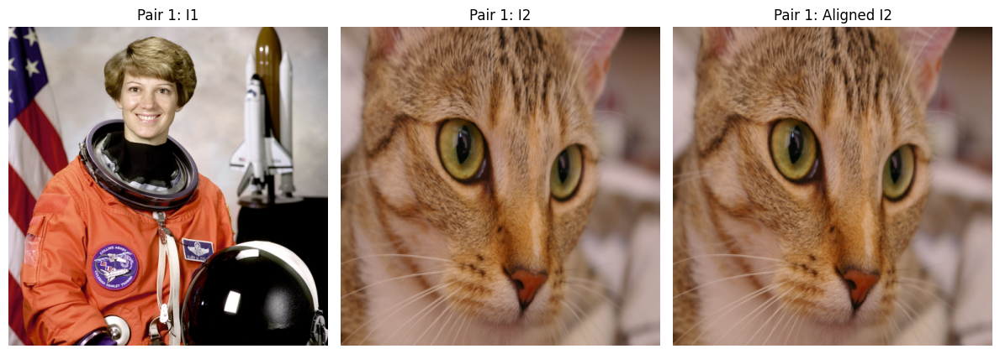

In [21]:
def align_affine(reference, moving, reference_points, moving_points):
    """Align moving image to reference image using 3 corresponding points."""

    reference_points = np.float32(reference_points)
    moving_points = np.float32(moving_points)

    M = cv2.getAffineTransform(moving_points, reference_points)

    height, width = reference.shape[:2]

    aligned = cv2.warpAffine(
        moving,
        M,
        (width, height),
        flags=cv2.INTER_LINEAR,
        borderMode=cv2.BORDER_REFLECT
    )

    return aligned


# Example alignment:
# The points below demonstrate the method.
# For your own image pairs, select actual corresponding important features.

h, w = p1_i1.shape[:2]

reference_points = [
    [w * 0.30, h * 0.35],
    [w * 0.70, h * 0.35],
    [w * 0.50, h * 0.65]
]

moving_points = [
    [w * 0.30, h * 0.35],
    [w * 0.70, h * 0.35],
    [w * 0.50, h * 0.65]
]

p1_i2_aligned = align_affine(
    p1_i1, p1_i2,
    reference_points, moving_points
)

p2_i2_aligned = p2_i2.copy()

plt.figure(figsize=(12, 5))

plt.subplot(1, 3, 1)
plt.imshow(p1_i1)
plt.title("Pair 1: I1")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(p1_i2)
plt.title("Pair 1: I2")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(p1_i2_aligned)
plt.title("Pair 1: Aligned I2")
plt.axis("off")

plt.tight_layout()
plt.show()

# 3. Spatial-Domain Gaussian Low-Pass and High-Pass Filtering

Low-pass filtering:

$$
LPF(I) = G_\sigma * I
$$

High-pass filtering:

$$
HPF(I) = I - LPF(I)
$$

Hybrid image:

$$
H = \alpha LPF(I_1) + \beta HPF(I_2)
$$


In [5]:
def gaussian_low_pass(image, kernel_size=31, sigma=5):
    return cv2.GaussianBlur(
        image,
        (kernel_size, kernel_size),
        sigmaX=sigma,
        sigmaY=sigma,
        borderType=cv2.BORDER_REFLECT
    )


def gaussian_high_pass(image, kernel_size=31, sigma=5):
    low_pass = gaussian_low_pass(image, kernel_size, sigma)
    return image - low_pass


def create_hybrid_spatial(
    low_image,
    high_image,
    kernel_size=31,
    sigma=5,
    alpha=1.0,
    beta=1.0
):
    low_component = gaussian_low_pass(low_image, kernel_size, sigma)
    high_component = gaussian_high_pass(high_image, kernel_size, sigma)

    # IMPORTANT:
    # Do not normalize high_component here.
    # It contains positive and negative values and these original values
    # must be used in the hybrid construction.
    hybrid = alpha * low_component + beta * high_component

    return low_component, high_component, hybrid


def normalize_for_display(image):
    min_val = image.min()
    max_val = image.max()

    if max_val - min_val == 0:
        return np.zeros_like(image)

    return (image - min_val) / (max_val - min_val)


def show_spatial_hybrid(low_image, high_image, title, kernel_size=31, sigma=5, alpha=1.0, beta=1.0):

    low, high, hybrid = create_hybrid_spatial(
        low_image, high_image,
        kernel_size, sigma, alpha, beta
    )

    plt.figure(figsize=(16, 8))

    images = [
        ("Original Low-Frequency Image", low_image),
        ("Original High-Frequency Image", high_image),
        ("Low-Pass Component", np.clip(low, 0, 1)),
        ("High-Pass Component (Visualization)", normalize_for_display(high)),
        ("Hybrid Image", np.clip(hybrid, 0, 1))
    ]

    for i, (name, image) in enumerate(images):
        plt.subplot(2, 3, i + 1)
        plt.imshow(image, cmap="gray" if image.ndim == 2 else None)
        plt.title(name)
        plt.axis("off")

    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

    return low, high, hybrid

# 4. Generate Hybrid Images for Two Pairs

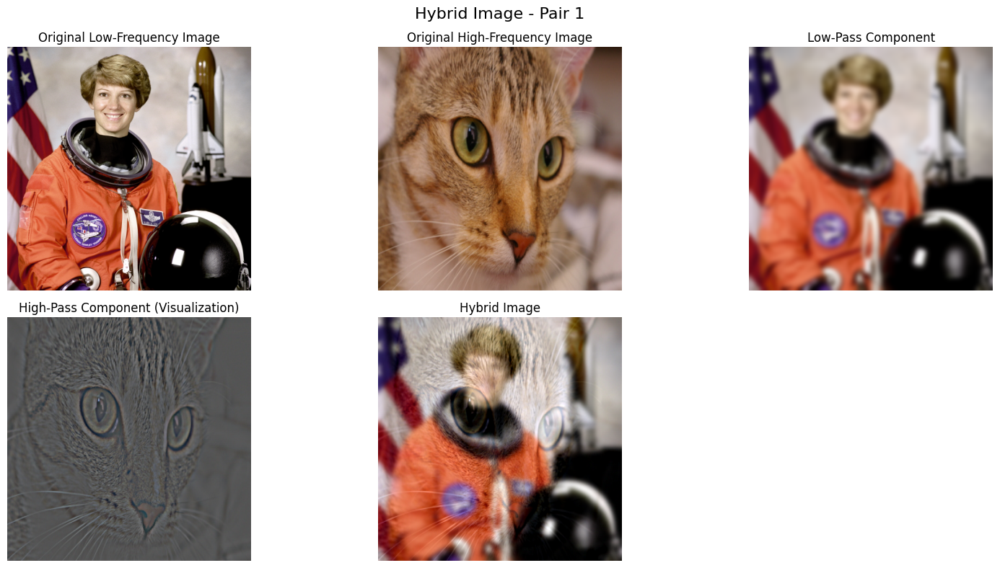

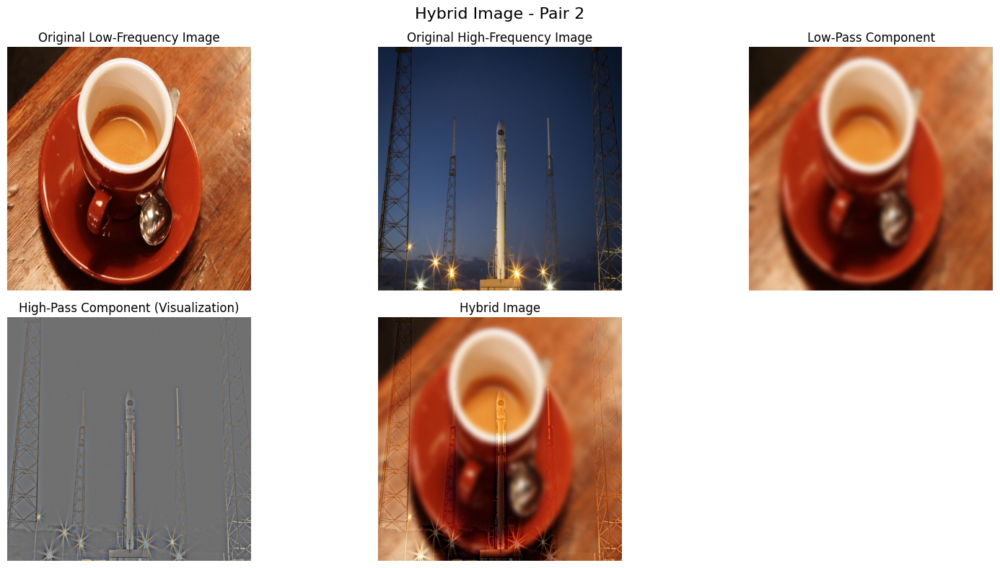

In [6]:
low1, high1, hybrid1 = show_spatial_hybrid(
    p1_i1,
    p1_i2_aligned,
    "Hybrid Image - Pair 1",
    kernel_size=31,
    sigma=5,
    alpha=1.0,
    beta=1.0
)

low2, high2, hybrid2 = show_spatial_hybrid(
    p2_i1,
    p2_i2_aligned,
    "Hybrid Image - Pair 2",
    kernel_size=31,
    sigma=5,
    alpha=1.0,
    beta=1.0
)

# 5. Parameter Experimentation

We experiment with:
- Gaussian kernel size
- Standard deviation `sigma`
- Low-frequency weight `alpha`
- High-frequency weight `beta`

The best parameters depend on the selected images.


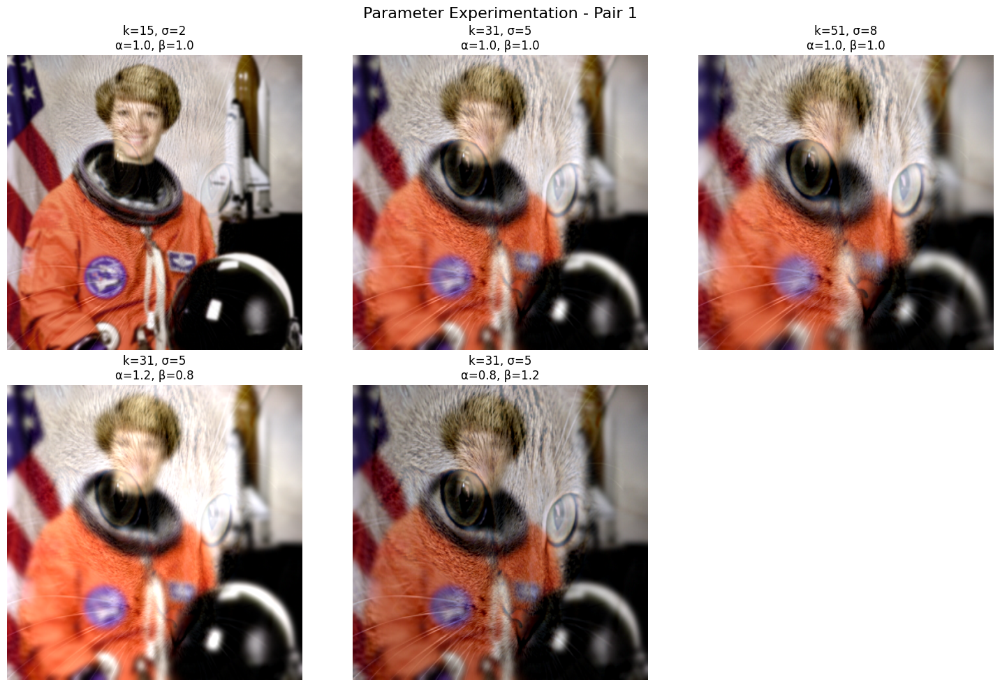

In [7]:
experiments = [
    (15, 2, 1.0, 1.0),
    (31, 5, 1.0, 1.0),
    (51, 8, 1.0, 1.0),
    (31, 5, 1.2, 0.8),
    (31, 5, 0.8, 1.2),
]

plt.figure(figsize=(15, 10))

for i, (kernel_size, sigma, alpha, beta) in enumerate(experiments):

    _, _, hybrid = create_hybrid_spatial(
        p1_i1,
        p1_i2_aligned,
        kernel_size,
        sigma,
        alpha,
        beta
    )

    plt.subplot(2, 3, i + 1)
    plt.imshow(np.clip(hybrid, 0, 1))
    plt.title(
        f"k={kernel_size}, σ={sigma}\n"
        f"α={alpha}, β={beta}"
    )
    plt.axis("off")

plt.suptitle("Parameter Experimentation - Pair 1", fontsize=16)
plt.tight_layout()
plt.show()

# 6. Frequency-Domain Filtering using 2D Fourier Transform

The 2D Fourier transform separates image information by spatial frequency.

A Gaussian low-pass filter in the frequency domain is:

\[
G(u,v) = e^{-\frac{D(u,v)^2}{2D_0^2}}
\]

High-pass filtering can be obtained as:

\[
HPF = 1 - LPF
\]


In [8]:
def gaussian_frequency_filter(shape, sigma):
    rows, cols = shape[:2]

    y = np.arange(rows) - rows / 2
    x = np.arange(cols) - cols / 2

    X, Y = np.meshgrid(x, y)

    D2 = X**2 + Y**2

    # Gaussian low-pass filter
    gaussian_filter = np.exp(-D2 / (2 * sigma**2))

    return gaussian_filter


def frequency_filter_image(image, sigma, high_pass=False):

    if image.ndim == 2:
        channels = [image]
    else:
        channels = [image[:, :, c] for c in range(image.shape[2])]

    filtered_channels = []

    for channel in channels:
        F = np.fft.fft2(channel)
        F_shift = np.fft.fftshift(F)

        G = gaussian_frequency_filter(channel.shape, sigma)

        if high_pass:
            G = 1 - G

        filtered_shift = F_shift * G

        filtered = np.fft.ifft2(np.fft.ifftshift(filtered_shift))
        filtered = np.real(filtered)

        filtered_channels.append(filtered)

    if image.ndim == 2:
        return filtered_channels[0]

    return np.stack(filtered_channels, axis=2)


def create_hybrid_frequency(
    low_image,
    high_image,
    sigma=30,
    alpha=1.0,
    beta=1.0
):
    low_component = frequency_filter_image(
        low_image,
        sigma,
        high_pass=False
    )

    high_component = frequency_filter_image(
        high_image,
        sigma,
        high_pass=True
    )

    hybrid = alpha * low_component + beta * high_component

    return low_component, high_component, hybrid

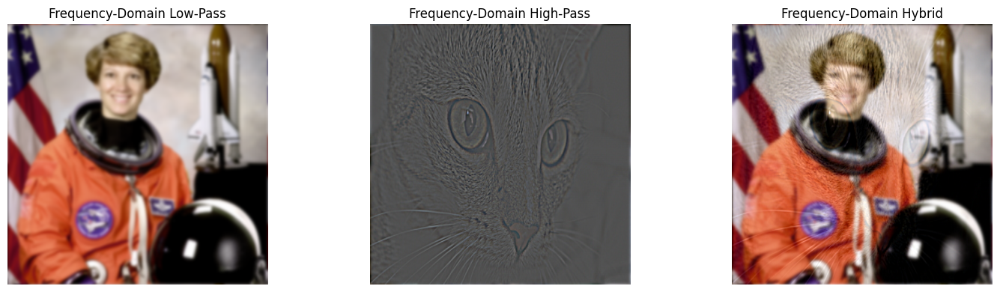

In [9]:
low_f, high_f, hybrid_f = create_hybrid_frequency(
    p1_i1,
    p1_i2_aligned,
    sigma=30,
    alpha=1.0,
    beta=1.0
)

plt.figure(figsize=(15, 4))

plt.subplot(1, 3, 1)
plt.imshow(np.clip(low_f, 0, 1))
plt.title("Frequency-Domain Low-Pass")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(normalize_for_display(high_f))
plt.title("Frequency-Domain High-Pass")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(np.clip(hybrid_f, 0, 1))
plt.title("Frequency-Domain Hybrid")
plt.axis("off")

plt.tight_layout()
plt.show()

# 7. Spatial vs Frequency Domain: Execution Time and Visual Comparison

Spatial-domain execution time:   0.029303 seconds
Frequency-domain execution time: 0.142643 seconds


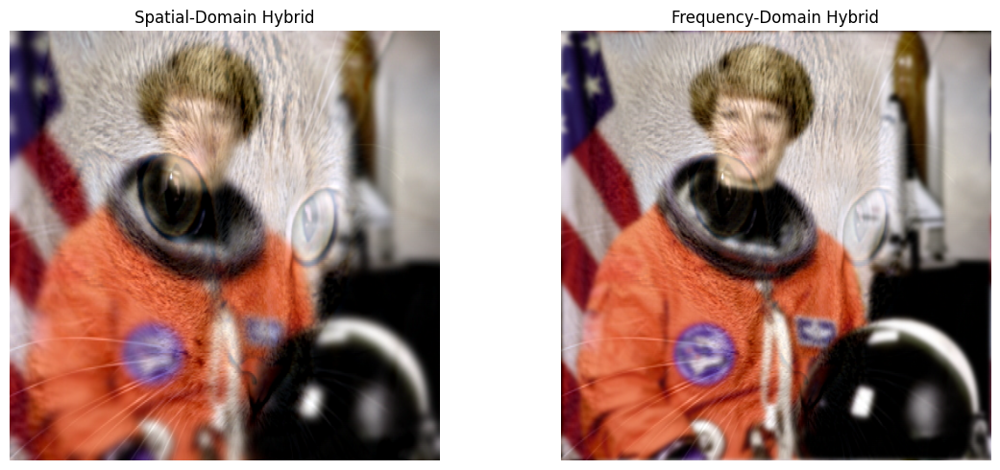

In [10]:
# Spatial-domain timing
start = time.perf_counter()

_, _, hybrid_spatial = create_hybrid_spatial(
    p1_i1,
    p1_i2_aligned,
    kernel_size=31,
    sigma=5,
    alpha=1.0,
    beta=1.0
)

spatial_time = time.perf_counter() - start


# Frequency-domain timing
start = time.perf_counter()

_, _, hybrid_frequency = create_hybrid_frequency(
    p1_i1,
    p1_i2_aligned,
    sigma=30,
    alpha=1.0,
    beta=1.0
)

frequency_time = time.perf_counter() - start


print(f"Spatial-domain execution time:   {spatial_time:.6f} seconds")
print(f"Frequency-domain execution time: {frequency_time:.6f} seconds")


plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(np.clip(hybrid_spatial, 0, 1))
plt.title("Spatial-Domain Hybrid")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(np.clip(hybrid_frequency, 0, 1))
plt.title("Frequency-Domain Hybrid")
plt.axis("off")

plt.tight_layout()
plt.show()

# 8. Gaussian Pyramid

A Gaussian pyramid repeatedly:
1. Blurs the image.
2. Downsamples it.

At lower levels, the image contains mainly low-frequency information.


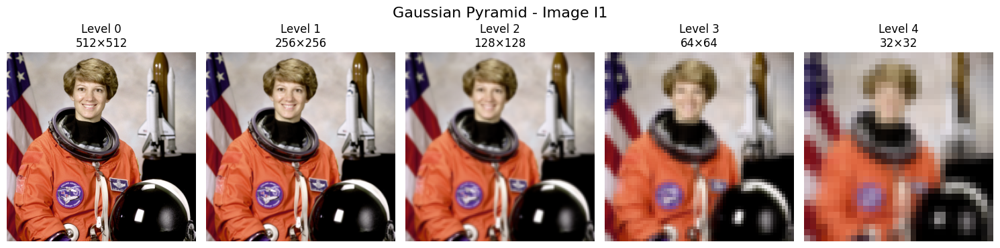

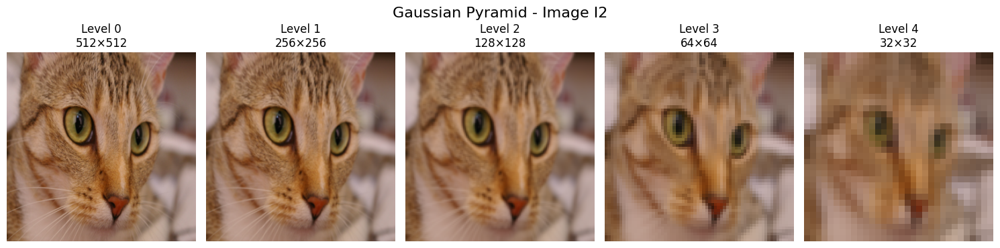

In [11]:
def gaussian_pyramid(image, levels=5):
    pyramid = [image]

    current = image

    for _ in range(levels - 1):
        current = cv2.pyrDown(current)
        pyramid.append(current)

    return pyramid


def display_pyramid(pyramid, title):
    plt.figure(figsize=(15, 4))

    for i, level in enumerate(pyramid):
        plt.subplot(1, len(pyramid), i + 1)
        plt.imshow(np.clip(level, 0, 1))
        plt.title(f"Level {i}\n{level.shape[1]}×{level.shape[0]}")
        plt.axis("off")

    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()


gaussian_pyr_1 = gaussian_pyramid(p1_i1, levels=5)
gaussian_pyr_2 = gaussian_pyramid(p1_i2_aligned, levels=5)

display_pyramid(gaussian_pyr_1, "Gaussian Pyramid - Image I1")
display_pyramid(gaussian_pyr_2, "Gaussian Pyramid - Image I2")

# 9. Laplacian Pyramid

A Laplacian level is the difference between:
- A Gaussian-pyramid level
- An expanded version of the next lower-resolution level

It contains band-pass / detail information.


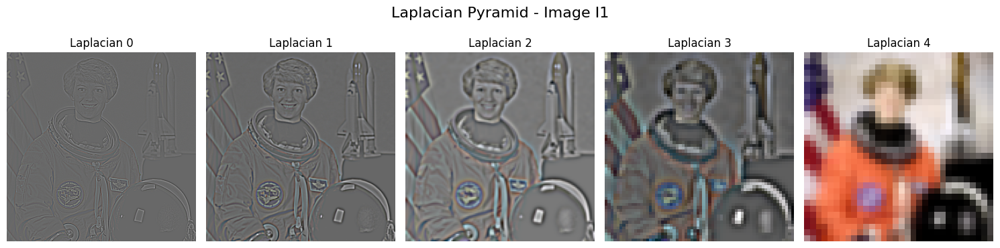

In [12]:
def laplacian_pyramid(image, levels=5):
    gaussian_pyr = gaussian_pyramid(image, levels)

    laplacian_pyr = []

    for i in range(levels - 1):
        current = gaussian_pyr[i]
        next_level = gaussian_pyr[i + 1]

        expanded = cv2.pyrUp(
            next_level,
            dstsize=(current.shape[1], current.shape[0])
        )

        laplacian = current - expanded
        laplacian_pyr.append(laplacian)

    # Last level is the smallest Gaussian image
    laplacian_pyr.append(gaussian_pyr[-1])

    return laplacian_pyr, gaussian_pyr


def reconstruct_laplacian_pyramid(laplacian_pyr):
    current = laplacian_pyr[-1]

    for i in range(len(laplacian_pyr) - 2, -1, -1):
        target = laplacian_pyr[i]

        current = cv2.pyrUp(
            current,
            dstsize=(target.shape[1], target.shape[0])
        )

        current = current + target

    return current


lap_pyr_1, gauss_pyr_1 = laplacian_pyramid(p1_i1, levels=5)
lap_pyr_2, gauss_pyr_2 = laplacian_pyramid(p1_i2_aligned, levels=5)


plt.figure(figsize=(15, 4))

for i, level in enumerate(lap_pyr_1):
    plt.subplot(1, len(lap_pyr_1), i + 1)
    plt.imshow(normalize_for_display(level))
    plt.title(f"Laplacian {i}")
    plt.axis("off")

plt.suptitle("Laplacian Pyramid - Image I1", fontsize=16)
plt.tight_layout()
plt.show()

# 10. Hybrid Image using Gaussian and Laplacian Pyramids

The low-frequency image is represented using a Gaussian pyramid.

The high-frequency image is represented using a Laplacian pyramid.

The final hybrid is reconstructed by combining:
- Gaussian low-frequency information from `I1`
- Laplacian high-frequency/detail information from `I2`


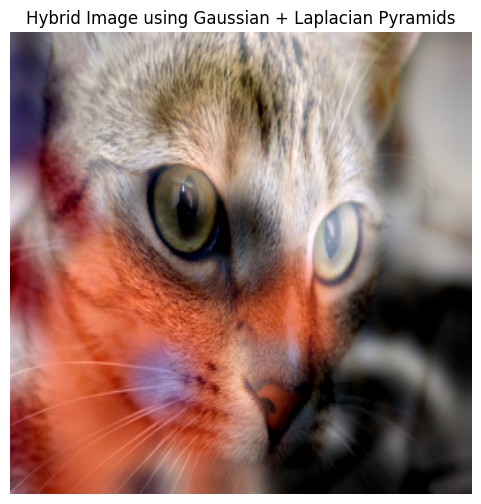

In [13]:
def pyramid_hybrid(low_image, high_image, levels=5, alpha=1.0, beta=1.0):

    low_gaussian = gaussian_pyramid(low_image, levels)
    high_laplacian, _ = laplacian_pyramid(high_image, levels)

    hybrid_laplacian = []

    # High-frequency details from image 2
    # and low-frequency information from image 1
    for i in range(levels - 1):
        hybrid_laplacian.append(beta * high_laplacian[i])

    # Lowest-frequency level from image 1
    hybrid_laplacian.append(alpha * low_gaussian[-1])

    hybrid = reconstruct_laplacian_pyramid(hybrid_laplacian)

    return hybrid


hybrid_pyramid = pyramid_hybrid(
    p1_i1,
    p1_i2_aligned,
    levels=5,
    alpha=1.0,
    beta=1.0
)

plt.figure(figsize=(6, 6))
plt.imshow(np.clip(hybrid_pyramid, 0, 1))
plt.title("Hybrid Image using Gaussian + Laplacian Pyramids")
plt.axis("off")
plt.show()

# 11. Bilateral Filtering for Laplacian Pyramids

A bilateral filter performs edge-preserving smoothing. Unlike Gaussian filtering, it considers:
- Spatial distance
- Pixel intensity difference

Therefore, it can preserve important edges while smoothing homogeneous regions.

Here, a bilateral-filtered pyramid is used to construct an edge-preserving Laplacian-style pyramid.


In [14]:
def bilateral_pyramid(image, levels=5, d=9, sigma_color=50, sigma_space=50):

    pyramid = [image.astype(np.float32)]
    current = image.astype(np.float32)

    for _ in range(levels - 1):

        filtered = cv2.bilateralFilter(
            current,
            d=d,
            sigmaColor=sigma_color,
            sigmaSpace=sigma_space
        )

        # Downsample after bilateral smoothing
        current = cv2.pyrDown(filtered)
        pyramid.append(current)

    return pyramid


def bilateral_laplacian_pyramid(
    image,
    levels=5,
    d=9,
    sigma_color=50,
    sigma_space=50
):

    bilateral_pyr = bilateral_pyramid(
        image,
        levels,
        d,
        sigma_color,
        sigma_space
    )

    laplacian_pyr = []

    for i in range(levels - 1):
        current = bilateral_pyr[i]
        next_level = bilateral_pyr[i + 1]

        expanded = cv2.pyrUp(
            next_level,
            dstsize=(current.shape[1], current.shape[0])
        )

        detail = current - expanded
        laplacian_pyr.append(detail)

    laplacian_pyr.append(bilateral_pyr[-1])

    return laplacian_pyr, bilateral_pyr

# 12. Hybrid Image using Gaussian Pyramid + Bilateral Laplacian Pyramid

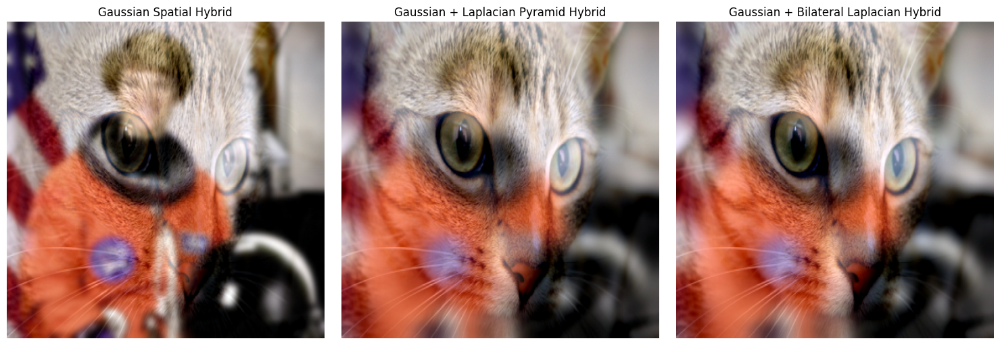

In [15]:
def bilateral_pyramid_hybrid(
    low_image,
    high_image,
    levels=5,
    alpha=1.0,
    beta=1.0,
    d=9,
    sigma_color=50,
    sigma_space=50
):

    # Gaussian pyramid for low-frequency image
    low_gaussian = gaussian_pyramid(low_image, levels)

    # Bilateral Laplacian pyramid for high-frequency image
    high_bilateral_laplacian, _ = bilateral_laplacian_pyramid(
        high_image,
        levels,
        d,
        sigma_color,
        sigma_space
    )

    hybrid_pyramid = []

    for i in range(levels - 1):
        hybrid_pyramid.append(beta * high_bilateral_laplacian[i])

    # Lowest-frequency component from the first image
    hybrid_pyramid.append(alpha * low_gaussian[-1])

    hybrid = reconstruct_laplacian_pyramid(hybrid_pyramid)

    return hybrid


hybrid_bilateral = bilateral_pyramid_hybrid(
    p1_i1,
    p1_i2_aligned,
    levels=5,
    alpha=1.0,
    beta=1.0
)


plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(np.clip(hybrid_spatial, 0, 1))
plt.title("Gaussian Spatial Hybrid")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(np.clip(hybrid_pyramid, 0, 1))
plt.title("Gaussian + Laplacian Pyramid Hybrid")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(np.clip(hybrid_bilateral, 0, 1))
plt.title("Gaussian + Bilateral Laplacian Hybrid")
plt.axis("off")

plt.tight_layout()
plt.show()

# 13. Viewing Distance / Downsampling Experiment

A hybrid image should show:
- More high-frequency information when viewed at full resolution.
- More low-frequency information when downsampled or viewed from far away.

This experiment creates progressively smaller versions of the hybrid image.


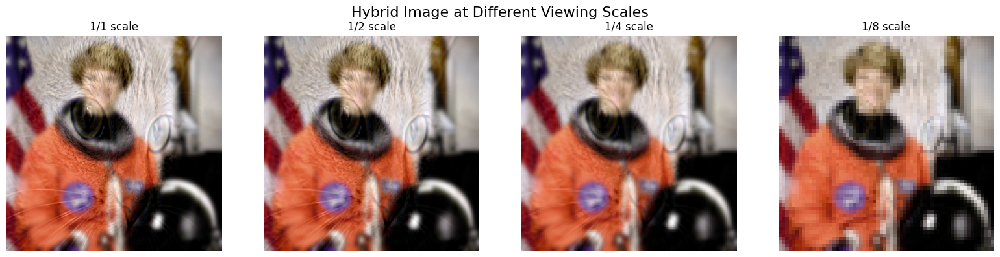

In [16]:
scales = [1, 2, 4, 8]

plt.figure(figsize=(16, 4))

for i, scale in enumerate(scales):

    if scale == 1:
        view = np.clip(hybrid_spatial, 0, 1)
    else:
        new_width = hybrid_spatial.shape[1] // scale
        new_height = hybrid_spatial.shape[0] // scale

        view = cv2.resize(
            np.clip(hybrid_spatial, 0, 1),
            (new_width, new_height),
            interpolation=cv2.INTER_AREA
        )

    plt.subplot(1, len(scales), i + 1)
    plt.imshow(view)
    plt.title(f"1/{scale} scale")
    plt.axis("off")

plt.suptitle("Hybrid Image at Different Viewing Scales", fontsize=16)
plt.tight_layout()
plt.show()

# 14. Comparison Table

The following table summarizes the methods used.


In [17]:
comparison = [
    {
        "Method": "Spatial Gaussian Hybrid",
        "Visual Quality": "Smooth and natural when images are well aligned",
        "Execution Time (s)": spatial_time,
        "Edge Preservation": "Moderate"
    },
    {
        "Method": "Frequency-Domain Hybrid",
        "Visual Quality": "Comparable frequency separation",
        "Execution Time (s)": frequency_time,
        "Edge Preservation": "Moderate"
    },
    {
        "Method": "Gaussian + Laplacian Pyramid",
        "Visual Quality": "Multi-scale frequency separation",
        "Execution Time (s)": np.nan,
        "Edge Preservation": "Good"
    },
    {
        "Method": "Gaussian + Bilateral Laplacian",
        "Visual Quality": "Edge-preserving multi-scale hybrid",
        "Execution Time (s)": np.nan,
        "Edge Preservation": "Best for strong edges"
    }
]

try:
    import pandas as pd
    display(pd.DataFrame(comparison))
except Exception:
    for row in comparison:
        print(row)

,Method,Visual Quality,Execution Time (s),Edge Preservation
0,Spatial Gaussian Hybrid,Smooth and natural when images are well aligned,0.029303,Moderate
1,Frequency-Domain Hybrid,Comparable frequency separation,0.142643,Moderate
2,Gaussian + Laplacian Pyramid,Multi-scale frequency separation,NaN,Good
3,Gaussian + Bilateral Laplacian,Edge-preserving multi-scale hybrid,NaN,Best for strong edges


# 15. Final Discussion and Conclusion

## Effect of Image Alignment
Image alignment is critical because corresponding important features should overlap. If the eyes, edges, object boundaries, or other key structures are misaligned, the hybrid image can appear as a double image or ghosted image. Suitable geometric transformations such as translation, rotation, scaling, or affine transformations improve alignment.

## Effect of Frequency Separation
The Gaussian low-pass filter controls how much large-scale structure from the first image remains. The high-pass component contains fine details and edges from the second image. A suitable cutoff is required:
- Too much low-pass filtering can make the distant image excessively blurred.
- Too much high-frequency information can dominate and hide the low-frequency image.
- Incorrect separation can cause both images to remain visible simultaneously.

## Spatial vs Frequency Domain
Both domains perform frequency separation:
- The spatial-domain approach is conceptually direct and convenient with Gaussian convolution.
- The frequency-domain approach explicitly manipulates frequency components using the 2D Fourier transform.
- For very large filters/images, frequency-domain convolution can become advantageous, while optimized spatial Gaussian filtering is often efficient for moderate filter sizes.

## Pyramid Methods
Gaussian and Laplacian pyramids provide multi-scale frequency decomposition:
- The Gaussian pyramid retains progressively lower-frequency information.
- The Laplacian pyramid represents detail information at multiple scales.
- Bilateral filtering can preserve strong edges better than ordinary Gaussian smoothing.

## Conclusion
The best hybrid image depends strongly on image selection, accurate alignment, filter parameters, and component weights. In general, good alignment combined with appropriate low/high frequency separation produces the clearest close-view versus distant-view effect.
